In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd

import os
for dirname, _, filenames in os.walk('Brats 2017'):
    # print(dirname,_,filenames)
    for filename in filenames:
        print(os.path.join(dirname))
import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

Brats 2017\BRATS2017\Brats17TestingData
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_31_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_31_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_31_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_31_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_32_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_32_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_32_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_32_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_33_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_33_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_33_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_33_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_34_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_34_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_34_1
Brats 2017\BRATS2017\Brats17TestingData\Brats17_2013_34_1
Brats 2017\BRATS2017\Brats17Test

# Preparing DataLoader

In [3]:
import os
import cv2
import glob
import PIL
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import montage 
import skimage.transform as skTrans
from skimage.transform import rotate
from skimage.transform import resize
from PIL import Image, ImageOps  

# neural imaging
import nilearn as nl
import nibabel as nib
import nilearn.plotting as nlplt

# neural networks
from glob import glob
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np
import pandas as pd
from matplotlib import animation, cm, colors, rc
from scipy import ndimage
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

## Lock seed

In [ ]:
import torch
import numpy as np
import random

def set_seed(seed=42):
    """Locks randomness for reproducibility"""
    random.seed(seed)  # Python random seed
    np.random.seed(seed)  # NumPy random seed
    torch.manual_seed(seed)  # PyTorch CPU seed
    torch.cuda.manual_seed(seed)  # PyTorch GPU seed
    torch.cuda.manual_seed_all(seed)  # If using multiple GPUs
    torch.backends.cudnn.deterministic = True  # Ensure deterministic behavior
    torch.backends.cudnn.benchmark = False  # Avoids auto-optimization

# Define your seed value
# set_seed(42)

## Single Modality


In [ ]:
import os
import torch as t
import nibabel as nib
import numpy as np
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

# Use GPU if available
device = t.device("cuda" if t.cuda.is_available() else "cpu")

# Define dataset paths
TRAIN_DATASET_PATH = "MICCAI_BraTS_Data_Training/"


dataset_paths = {
    "2013": [],
    "CBICA": [],
    "TCIA01": [],
    "TMC": []
}


# Collect dataset paths
for root, dirs, files in os.walk(TRAIN_DATASET_PATH):
    for dir_name in dirs:
        if "BraTS19" in dir_name:
            if "2013" in dir_name:
                dataset_paths["2013"].append(os.path.join(root, dir_name))
            elif "CBICA" in dir_name:
                dataset_paths["CBICA"].append(os.path.join(root, dir_name))
            elif "TCIA01" in dir_name:
                dataset_paths["TCIA01"].append(os.path.join(root, dir_name))
            elif "TMC" in dir_name:
                dataset_paths["TMC"].append(os.path.join(root, dir_name))


chosen_modality = "t2"
segmentation_modality = "seg"

from sklearn.preprocessing import MinMaxScaler
import numpy as np

def normalize_mri(img, feature_range=(-1, 1)):
    scaler = MinMaxScaler(feature_range=feature_range)
    img = img.reshape(-1, 1)
    img = scaler.fit_transform(img)
    img = img.reshape(240, 240)
    return img

class BraTS_T2_Dataset(Dataset):
    def __init__(self, dataset_paths, leave_out_domain, slice_index=15):
        self.data = []
        self.target_data = []
        self.slice_index = slice_index

        for domain_label, paths in dataset_paths.items():
            for path in paths:
                t2_file_path = os.path.join(path, f"{os.path.basename(path)}_{chosen_modality}.nii")
                seg_file_path = os.path.join(path, f"{os.path.basename(path)}_{segmentation_modality}.nii")

                if os.path.exists(t2_file_path) and os.path.exists(seg_file_path):
                    t2_img = nib.load(t2_file_path).get_fdata()
                    seg_img = nib.load(seg_file_path).get_fdata()
                    t2_img = normalize_mri(t2_img[:, :, self.slice_index])
                    seg_img = seg_img[:, :, self.slice_index]
                    t2_tensor = t.tensor(t2_img, dtype=t.float32)  
                    seg_tensor = t.tensor(seg_img, dtype=t.float32) 
                    if domain_label == leave_out_domain:
                        self.target_data.append((t2_tensor, seg_tensor, domain_label))
                    else:
                        self.data.append((t2_tensor, seg_tensor, domain_label))

                else:
                    print(f"Missing files: {t2_file_path} or {seg_file_path}")


    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx] 

    def get_target_set(self):
        return self.target_data 

leave_out_domain = "CBICA" 

print(f"\n Selected Leave-One-Out Domain: {leave_out_domain}\n")

dataset = BraTS_T2_Dataset(dataset_paths, leave_out_domain, slice_index=85)

batch_size = 24

train_dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=0)


target_data = dataset.get_target_set()
test_dataloader = DataLoader(target_data, batch_size=len(target_data)//4, shuffle=False, num_workers=0)

In [ ]:
import matplotlib.pyplot as plt

def plot_batch_mri_segmentation(mri_batch, seg_batch, domain_labels, title="Batch Visualization"):
    """
    Function to visualize all MRI images and segmentation masks in a batch.
    
    Parameters:
      mri_batch (Tensor): Tensor of shape [batch, H, W]  (slices).
      seg_batch (Tensor): Tensor of shape [batch, H, W] (Segmentation masks).
      domain_labels (list/tuple): Labels for each image in the batch.
      title (str): Title for the plot.
      
    This function displays each sample's MRI image alongside its segmentation mask.
    """
    mri_np = mri_batch.detach().cpu().numpy()
    seg_np = seg_batch.detach().cpu().numpy()

    batch_size = mri_np.shape[0] 

    fig, axes = plt.subplots(batch_size, 2, figsize=(10, 5 * batch_size))

    if batch_size == 1:
        axes = [axes] 

    fig.suptitle(f"{title} - Domains: {domain_labels}", fontsize=16)

    for i in range(batch_size):
        axes[i][0].imshow(mri_np[i], cmap="gray")
        axes[i][0].set_title(f"Sample {i+1}: MRI")
        axes[i][0].axis("off")

        axes[i][1].imshow(seg_np[i], cmap="viridis")
        axes[i][1].set_title(f"Sample {i+1}: Segmentation Mask")
        axes[i][1].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

tensor(1.) tensor(-1.)


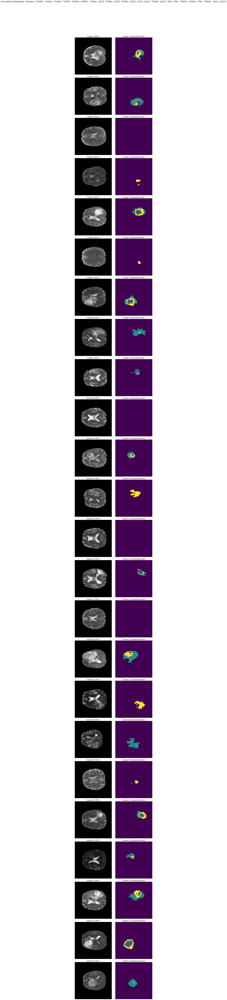

In [ ]:
for images, segmentations, domains in train_dataloader:
    print(torch.max(images[0]),torch.min(images[0]))
    plot_batch_mri_segmentation(images, segmentations, domains, title="Train Batch Visualization")
    break

# Global Domain Alignment

# Model

In [ ]:
from torch.autograd import Function

class GradientReversalFunction(Function):
    @staticmethod
    def forward(ctx, x, lambda_grl):
        ctx.lambda_grl = lambda_grl
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return -ctx.lambda_grl * grad_output, None


In [ ]:
class GlobalDomainAlignment(nn.Module):
    def __init__(self, latent_dim=128, lambda_grl=1.0):
        super(GlobalDomainAlignment, self).__init__()
        self.lambda_grl = lambda_grl

        # **Feature Extractor (G_f)**
        self.feature_extractor = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            # nn.Dropout(0.15),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(128)
        )

        # Compute feature size dynamically
        dummy_input = torch.randn(1, 1, 240, 240)
        conv_out_shape = self.feature_extractor(dummy_input).shape
        flattened_size = conv_out_shape[1] * conv_out_shape[2] * conv_out_shape[3]


        self.flatten = nn.Flatten()
        self.fc = nn.Linear(flattened_size, latent_dim)
        self.relu = nn.ReLU()

        # **Decoder (G_r) for Reconstruction**
        # **Decoder (G_r) for Reconstruction with Skip Connections**
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, flattened_size),
            nn.ReLU(),
            nn.Unflatten(1, (128, conv_out_shape[2], conv_out_shape[3])),
            nn.BatchNorm2d(128),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(64),

            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(32),

            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),

            nn.ConvTranspose2d(16, 1, kernel_size=3, stride=1, padding=1),
            nn.Tanh() 
        )


        # **Domain Classifier (G_d)**
        self.domain_classifier = nn.Sequential(
            nn.Linear(latent_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 4),
            nn.LogSoftmax(dim=1)
        )

    def forward(self, x, lambda_grl=1.0):
        x = x.unsqueeze(1)
        features = self.feature_extractor(x)
        features = self.flatten(features)
        features = self.fc(features)
        features = self.relu(features)
        reconstructed_x = self.decoder(features).squeeze(1)+x.squeeze(1)
        reversed_features = GradientReversalFunction.apply(features, lambda_grl)
        domain_pred = self.domain_classifier(reversed_features)

        return reconstructed_x, domain_pred

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GlobalDomainAlignment(latent_dim=256).to(device)

for images, _, domains in train_dataloader:  
    images = images.to(device)
    print(domains)
    reconstructed_images, domain_predictions = model(images, lambda_grl=1.0)
    print(f"Input Shape: {images.shape}")
    print(f"Reconstructed Shape: {reconstructed_images.shape}")
    print(f"Domain Predictions Shape: {t.argmax(domain_predictions,axis=1)}") 

    break 


('TCIA01', 'TCIA01', 'TCIA01', 'TCIA01', 'TCIA01', '2013', '2013', '2013', 'TMC', '2013', '2013', 'TCIA01', '2013', 'TCIA01', 'TMC', '2013', 'TMC', 'TCIA01', '2013', '2013', 'TCIA01', 'TCIA01', '2013', '2013')
Input Shape: torch.Size([24, 240, 240])
Reconstructed Shape: torch.Size([24, 240, 240])
Domain Predictions Shape: tensor([0, 2, 2, 2, 0, 0, 0, 0, 1, 1, 2, 0, 0, 0, 2, 1, 1, 1, 1, 0, 2, 1, 0, 0],
       device='cuda:0')


## Train Global Alignment

In [ ]:
import matplotlib.pyplot as plt

def plot_batch_mri_reconstruction(original_batch, reconstructed_batch, domain_labels, title="Reconstruction Visualization"):
    """
    Function to visualize original MRI images and their reconstructed versions in a batch.
    
    Parameters:
      original_batch (Tensor): Tensor of shape [batch, H, W] (Original T2 slices).
      reconstructed_batch (Tensor): Tensor of shape [batch, H, W] (Reconstructed MRI from model).
      domain_labels (list/tuple): Labels for each image in the batch.
      title (str): Title for the plot.
      
    This function displays each sample's original MRI alongside its reconstructed version.
    """
    original_np = original_batch.detach().cpu().numpy()
    reconstructed_np = reconstructed_batch.detach().cpu().numpy()

    batch_size = original_np.shape[0] 

    fig, axes = plt.subplots(batch_size, 2, figsize=(10, 5 * batch_size))

    if batch_size == 1:
        axes = [axes] 

    fig.suptitle(f"{title} - Domains: {domain_labels}", fontsize=16)

    for i in range(batch_size):
        axes[i][0].imshow(original_np[i], cmap="gray")
        axes[i][0].set_title(f"Sample {i+1}: Original MRI T2")
        axes[i][0].axis("off")

        axes[i][1].imshow(reconstructed_np[i], cmap="gray")
        axes[i][1].set_title(f"Sample {i+1}: Reconstructed MRI T2")
        axes[i][1].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
reconstruction_loss_fn = nn.SmoothL1Loss()  
domain_loss_fn = nn.NLLLoss()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GlobalDomainAlignment(latent_dim=256).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


Epoch [1/100] - Total Loss: 113.6551, Reconstruction Loss: 0.2343, Domain Loss: 113.4208
Epoch [2/100] - Total Loss: 401.4183, Reconstruction Loss: 0.1079, Domain Loss: 401.3104
Epoch [3/100] - Total Loss: 401.1732, Reconstruction Loss: 0.0561, Domain Loss: 401.1171
Epoch [4/100] - Total Loss: 125.7152, Reconstruction Loss: 0.0381, Domain Loss: 125.6771
Epoch [5/100] - Total Loss: 38.4014, Reconstruction Loss: 0.0266, Domain Loss: 38.3747
Epoch [6/100] - Total Loss: 53.9499, Reconstruction Loss: 0.0191, Domain Loss: 53.9308
Epoch [7/100] - Total Loss: 48.9672, Reconstruction Loss: 0.0142, Domain Loss: 48.9530
Epoch [8/100] - Total Loss: 33.6016, Reconstruction Loss: 0.0114, Domain Loss: 33.5902
Epoch [9/100] - Total Loss: 32.8903, Reconstruction Loss: 0.0086, Domain Loss: 32.8817
Epoch [10/100] - Total Loss: 26.9396, Reconstruction Loss: 0.0068, Domain Loss: 26.9328
Epoch [11/100] - Total Loss: 60.9330, Reconstruction Loss: 0.0054, Domain Loss: 60.9276
Epoch [12/100] - Total Loss: 35.2

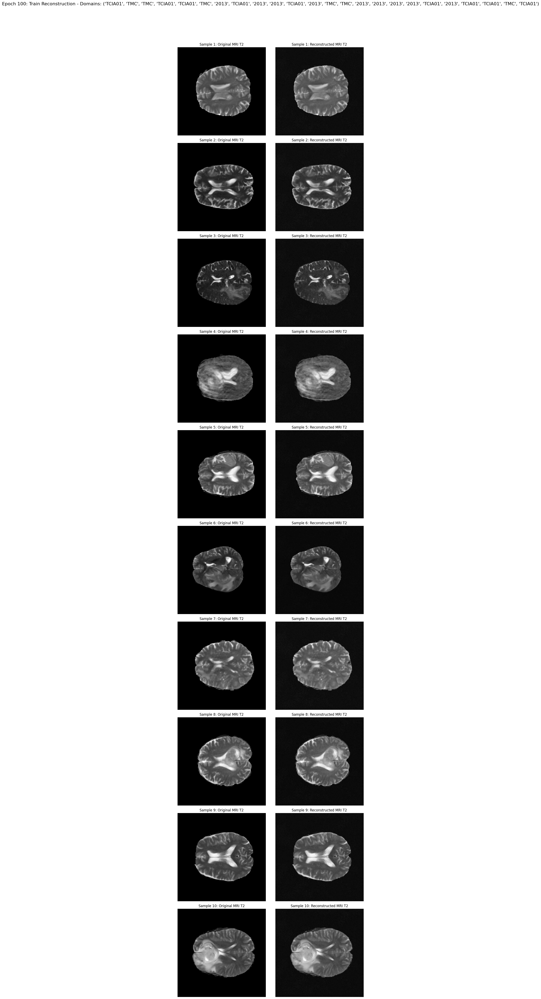

In [ ]:
num_epochs = 100 # Adjust as needed
lambda_grl = 1.4 # Gradient Reversal Lambda (Adversarial Strength)

train_losses = []
recon_losses = []
domain_losses = []

for epoch in range(1, num_epochs + 1):
    model.train()
    total_loss = 0
    total_reconstruction_loss = 0
    total_domain_loss = 0

    for images, _, domains in train_dataloader:  
        images = images.to(device) 

        reconstructed_images, domain_predictions = model(images, lambda_grl)

        reconstruction_loss = reconstruction_loss_fn(reconstructed_images, images)
        domain_loss = domain_loss_fn(domain_predictions, torch.tensor([list(dataset_paths.keys()).index(d) for d in domains], device=device))

        total_batch_loss = reconstruction_loss + domain_loss

        optimizer.zero_grad()
        total_batch_loss.backward()
        optimizer.step()

        total_loss += total_batch_loss.item()
        total_reconstruction_loss += reconstruction_loss.item()
        total_domain_loss += domain_loss.item()
    train_losses.append(total_loss)
    recon_losses.append(total_reconstruction_loss)
    domain_losses.append(total_domain_loss)
    print(f"Epoch [{epoch}/{num_epochs}] - "
          f"Total Loss: {total_loss:.4f}, "
          f"Reconstruction Loss: {total_reconstruction_loss:.4f}, "
          f"Domain Loss: {total_domain_loss:.4f}")

    if epoch % 100 == 0:
        model.eval()
        with torch.no_grad():
            for images, _, domains in train_dataloader:
                images = images.to(device)  
                reconstructed_images, _ = model(images, lambda_grl)
                plot_batch_mri_reconstruction(images[:10], reconstructed_images[:10], domains, title=f"Epoch {epoch}: Train Reconstruction")
                break 
        model.train()

In [ ]:
model.eval()
with torch.no_grad():
            for images, _, domains in test_dataloader:
                images = images.to(device) 
                reconstructed_images, _ = model(images, lambda_grl)
                print(torch.argmax(_,axis=1))
                plot_batch_mri_reconstruction(images, reconstructed_images, domains, title=f"Epoch {epoch}: Train Reconstruction")
                break

tensor([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 0, 2, 0], device='cuda:0')


In [57]:
torch.save(model.state_dict(), "saved/global_{}.pth".format(leave_out_domain))

## T-SNE

In [ ]:
import torch

def extract_features(dataloader, model, device):
    """Extracts features from the dataset using the encoder model"""
    model.eval()  # Set model to evaluation mode
    features = []
    labels = []
    
    with torch.no_grad():
        for batch in dataloader:
            t2_mri, _, domain_labels = batch
            t2_mri = t2_mri.to(device).unsqueeze(1)
            
            encoded_features = model.feature_extractor(t2_mri)
            encoded_features = encoded_features.view(encoded_features.size(0), -1) 
            
            features.append(encoded_features.cpu().numpy())
            labels.extend(domain_labels)
    
    return np.concatenate(features, axis=0), labels

import numpy as np

def extract_feature_raw(dataloader, device):
    """Extracts handcrafted statistical features from the dataset without using the model."""
    features = []
    labels = []
    
    for batch in dataloader:
        t2_mri, _, domain_labels = batch 
        t2_mri = t2_mri.to(device).cpu().numpy() 
        
        batch_features = []
        for img in t2_mri:
            img_flat = img.flatten()
            mean = np.mean(img_flat)
            std = np.std(img_flat)
            min_val = np.min(img_flat)
            max_val = np.max(img_flat)
            batch_features.append([mean, std, min_val, max_val]) 
        
        features.append(np.array(batch_features))
        labels.extend(domain_labels)
    
    return np.concatenate(features, axis=0), labels



In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def plot_tsne(source_features, source_labels, target_features, target_labels,title):
    """Apply t-SNE and plot feature distributions for source & target domains"""
    all_features = np.concatenate((source_features, target_features), axis=0)
    all_labels = np.array(source_labels + target_labels)
    tsne = TSNE(n_components=2, perplexity=10, random_state=42)
    reduced_features = tsne.fit_transform(all_features)

    num_source = len(source_labels)
    plt.figure(figsize=(8, 6))
    plt.scatter(reduced_features[:num_source, 0], reduced_features[:num_source, 1], c='blue', alpha=0.5, label="Source")
    plt.scatter(reduced_features[num_source:, 0], reduced_features[num_source:, 1], c='red', alpha=0.5, label="Target")



    plt.legend()
    plt.title(title)
    plt.show()


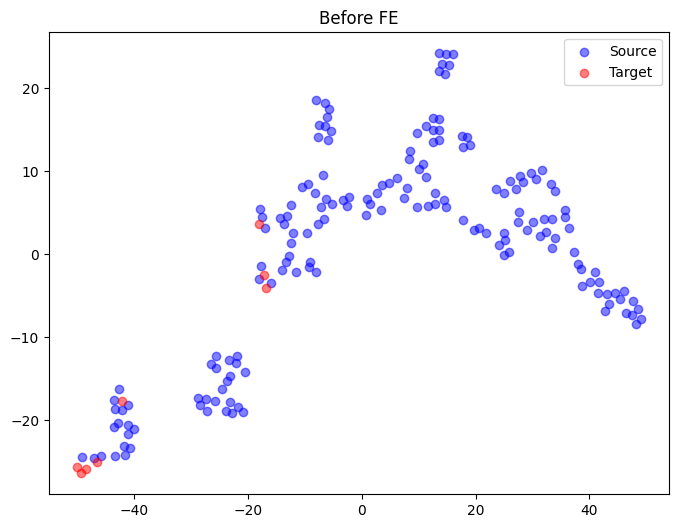

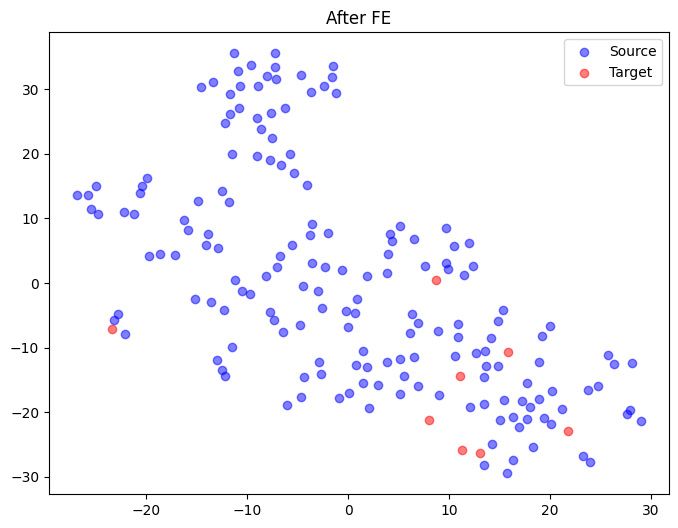

In [ ]:
source_features_after, source_labels_after = extract_feature_raw(train_dataloader, device)
target_features_after, target_labels_after = extract_feature_raw(test_dataloader, device)

plot_tsne(source_features_after, source_labels_after, target_features_after, target_labels_after,title="Before FE")
source_features, source_labels = extract_features(train_dataloader, model, device)
target_features, target_labels = extract_features(test_dataloader, model, device)

plot_tsne(source_features, source_labels, target_features, target_labels,title="After FE")


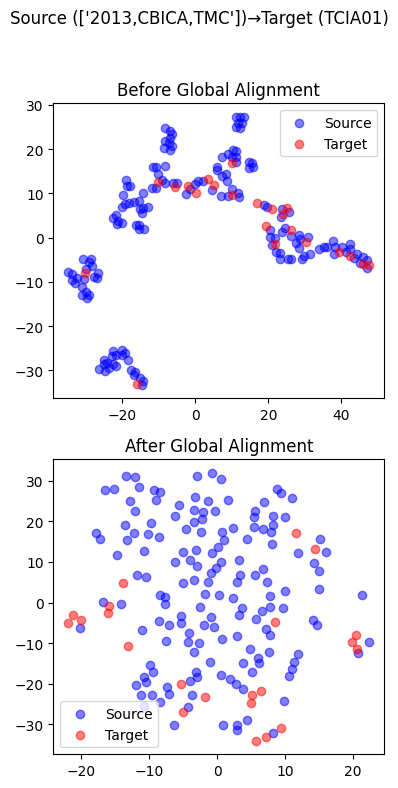

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

def extract_features(dataloader, model, device):
    """Extracts features from the dataset using the encoder model"""
    model.eval()
    features = []
    labels = []
    
    with torch.no_grad():
        for batch in dataloader:
            t2_mri, _, domain_labels = batch
            t2_mri = t2_mri.to(device).unsqueeze(1)
            
            # Pass through feature extractor
            encoded_features = model.feature_extractor(t2_mri)
            encoded_features = encoded_features.view(encoded_features.size(0), -1)  # Flatten
            
            # Store features and labels
            features.append(encoded_features.cpu().numpy())
            labels.extend(domain_labels)
    
    return np.concatenate(features, axis=0), labels

def extract_feature_raw(dataloader, device):
    """Extracts handcrafted statistical features from the dataset without using the model."""
    features = []
    labels = []
    
    for batch in dataloader:
        t2_mri, _, domain_labels = batch
        t2_mri = t2_mri.to(device).cpu().numpy()
        
        batch_features = []
        for img in t2_mri:
            img_flat = img.flatten()
            mean = np.mean(img_flat)
            std = np.std(img_flat)
            min_val = np.min(img_flat)
            max_val = np.max(img_flat)
            batch_features.append([mean, std, min_val, max_val]) 
        
        features.append(np.array(batch_features))
        labels.extend(domain_labels)
    
    return np.concatenate(features, axis=0), labels

def plot_tsne_stacked(source_features_before, source_labels_before, target_features_before, target_labels_before,
                      source_features_after, source_labels_after, target_features_after, target_labels_after):
    """Plot t-SNE Before and After Feature Extraction in a single vertical figure"""

    fig, axes = plt.subplots(2, 1, figsize=(4, 8))
    fig.suptitle("Source ({})→Target ({})".format([",".join([x for x in dataset_paths.keys() if x != leave_out_domain])],leave_out_domain))
    fig.subplots_adjust(top=0.92)
    all_features_before = np.concatenate((source_features_before, target_features_before), axis=0)
    all_labels_before = np.array(source_labels_before + target_labels_before)
    tsne_before = TSNE(n_components=2, perplexity=10, random_state=42)
    reduced_features_before = tsne_before.fit_transform(all_features_before)
    num_source = len(source_labels_before)
    axes[0].scatter(reduced_features_before[:num_source, 0], reduced_features_before[:num_source, 1], 
                    c='blue', alpha=0.5, label="Source")
    axes[0].scatter(reduced_features_before[num_source:, 0], reduced_features_before[num_source:, 1], 
                    c='red', alpha=0.5, label="Target")
    axes[0].legend()
    axes[0].set_title("Before Global Alignment")

    all_features_after = np.concatenate((source_features_after, target_features_after), axis=0)
    all_labels_after = np.array(source_labels_after + target_labels_after)
    tsne_after = TSNE(n_components=2, perplexity=10, random_state=42)
    reduced_features_after = tsne_after.fit_transform(all_features_after)

    num_source = len(source_labels_after)
    axes[1].scatter(reduced_features_after[:num_source, 0], reduced_features_after[:num_source, 1], 
                    c='blue', alpha=0.5, label="Source")
    axes[1].scatter(reduced_features_after[num_source:, 0], reduced_features_after[num_source:, 1], 
                    c='red', alpha=0.5, label="Target")
    axes[1].legend()
    axes[1].set_title("After Global Alignment")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

source_features_before, source_labels_before = extract_feature_raw(train_dataloader, device)
target_features_before, target_labels_before = extract_feature_raw(test_dataloader, device)

source_features_after, source_labels_after = extract_features(train_dataloader, model, device)
target_features_after, target_labels_after = extract_features(test_dataloader, model, device)

plot_tsne_stacked(source_features_before, source_labels_before, target_features_before, target_labels_before,
                  source_features_after, source_labels_after, target_features_after, target_labels_after)


## Yolo

In [ ]:
class YOLO_ReconstructedDataset(Dataset):
    def __init__(self, dataset_paths, leave_out_domain, slice_index=85,
                 generator=None, device='cpu', modality="t2", label_ext="yolo.txt"):
        self.data = []
        self.slice_index = slice_index
        self.generator = generator
        self.device = device
        self.modality = modality
        self.label_ext = label_ext

        for domain_label, paths in dataset_paths.items():
            for path in paths:
                base = os.path.basename(path)

                t2_path = os.path.join(path, f"{base}_{modality}.nii")
                label_path = os.path.join(path, f"{base}_{modality}_slice{slice_index}_{label_ext}")

                if not os.path.exists(t2_path) or not os.path.exists(label_path):
                    continue

                t2_data = nib.load(t2_path).get_fdata()
                if slice_index >= t2_data.shape[2]:
                    continue
                t2_slice = normalize_mri(t2_data[:, :, slice_index])  # [H, W]
                t2_tensor = torch.tensor(t2_slice, dtype=torch.float32).to(self.device)

                if t2_tensor.ndim == 2:
                    t2_tensor = t2_tensor.unsqueeze(0) 
                # Reconstruct using generator
                with torch.no_grad():
                    output = self.generator(t2_tensor)
                    if isinstance(output, tuple):
                        output = output[0]
                    recon_tensor = output.squeeze().cpu()

                bboxes = []
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            bboxes.append([float(x) for x in parts])

                if domain_label != leave_out_domain:
                    self.data.append((recon_tensor, bboxes))

    def __len__(self):
        return len(self.data)
    def get_target_set(self, leave_out_domain):
        target_data = []

        for domain_label, paths in dataset_paths.items():
            if domain_label != leave_out_domain:
                continue

            for path in paths:
                base = os.path.basename(path)

                t2_path = os.path.join(path, f"{base}_{self.modality}.nii")
                label_path = os.path.join(path, f"{base}_{self.modality}_slice{self.slice_index}_{self.label_ext}")

                if not os.path.exists(t2_path) or not os.path.exists(label_path):
                    continue

                t2_data = nib.load(t2_path).get_fdata()
                if self.slice_index >= t2_data.shape[2]:
                    continue

                t2_slice = normalize_mri(t2_data[:, :, self.slice_index])
                t2_tensor = torch.tensor(t2_slice, dtype=torch.float32).to(self.device)

                if t2_tensor.ndim == 2:
                    t2_tensor = t2_tensor.unsqueeze(0)

                with torch.no_grad():
                    output = self.generator(t2_tensor)
                    if isinstance(output, tuple):
                        output = output[0]
                    recon_tensor = output.squeeze().cpu() 

                bboxes = []
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            bboxes.append([float(x) for x in parts])

                target_data.append((recon_tensor.unsqueeze(0), bboxes))
        return target_data

    def __getitem__(self, idx):
        recon_tensor, bboxes = self.data[idx]
        return recon_tensor.unsqueeze(0), bboxes


In [ ]:
def yolo_collate_fn(batch):
    images = [item[0] for item in batch] 
    labels = [item[1] for item in batch]
    images = torch.stack(images, dim=0)
    return images, labels

In [ ]:
# Load Generator
generator = GlobalDomainAlignment(latent_dim=256)
generator.load_state_dict(torch.load("saved/global_{}.pth".format(leave_out_domain)))
generator.eval().to(device)

yolo_dataset = YOLO_ReconstructedDataset(
    dataset_paths=dataset_paths,
    leave_out_domain=leave_out_domain,
    slice_index=85,
    generator=generator,
    device=device,
)

yolo_train_dataloader = DataLoader(yolo_dataset, batch_size=8, shuffle=True,collate_fn=yolo_collate_fn)
yolo_test_data = yolo_dataset.get_target_set(leave_out_domain=leave_out_domain)
yolo_test_dataloader = DataLoader(
    yolo_test_data,
    batch_size=len(target_data),
    shuffle=False,
    collate_fn=yolo_collate_fn 
)

In [99]:
len(yolo_train_dataloader)*yolo_train_dataloader.batch_size,len(yolo_test_dataloader)*yolo_test_dataloader.batch_size

(56, 129)

### Visualize

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def show_yolo_image(img_tensor, bboxes, title="Reconstructed + YOLO BBox"):
    img = img_tensor.squeeze().numpy()  # [H, W]
    h, w = img.shape

    fig, ax = plt.subplots(1, figsize=(6, 6))
    ax.imshow(img, cmap='gray')

    for bbox in bboxes:
        cls, xc, yc, bw, bh = bbox
        x = (xc - bw / 2) * w
        y = (yc - bh / 2) * h
        width = bw * w
        height = bh * h
        rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    ax.set_title(title)
    ax.axis('off')
    plt.show()


## Training

In [ ]:
import os
from PIL import Image

def save_yolo_dataset(dataloader, save_dir, prefix="train"):
    img_dir = os.path.join(save_dir, "images", prefix)
    label_dir = os.path.join(save_dir, "labels", prefix)
    os.makedirs(img_dir, exist_ok=True)
    os.makedirs(label_dir, exist_ok=True)

    counter = 0
    for images, bboxes_batch in dataloader:
        for i in range(images.shape[0]):
            img_tensor = images[i].squeeze().numpy()  # [H, W]
            bboxes = bboxes_batch[i]
            img_array = images[i].squeeze().numpy()  # [H, W]

            img_norm = (img_array - img_array.min()) / (img_array.max() - img_array.min())
            img_uint8 = (img_norm * 255).astype(np.uint8)

            img_pil = Image.fromarray(img_uint8)
            img_pil.save(os.path.join(img_dir, f"img_{prefix}_{counter}.jpg"))

            label_path = os.path.join(label_dir, f"img_{prefix}_{counter}.txt")
            with open(label_path, 'w') as f:
                for bbox in bboxes:
                    f.write(" ".join([str(round(x, 6)) for x in bbox]) + "\n")

            counter += 1

    print(f"Saved {counter} samples to {img_dir}")


In [ ]:
save_yolo_dataset(yolo_train_dataloader, save_dir="yolo_dataset", prefix="train")
save_yolo_dataset(yolo_test_dataloader, save_dir="yolo_dataset", prefix="val")

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8m.yaml") 
model.train(data="yolo_brats.yaml", epochs=250, imgsz=240, batch=16,augment=True)

## Evaluation

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
from ultralytics import YOLO
from torchvision.ops import box_iou
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

model = YOLO("runs/detect/train15/weights/best.pt") # path to your trained YOLO model

def yolo_to_xyxy(bbox, img_shape):
    _, xc, yc, w, h = bbox
    H, W = img_shape
    x1 = (xc - w/2) * W
    y1 = (yc - h/2) * H
    x2 = (xc + w/2) * W
    y2 = (yc + h/2) * H
    return [x1, y1, x2, y2]

def calculate_iou(box1, box2):
    box1 = torch.tensor(box1).unsqueeze(0)
    box2 = torch.tensor(box2).unsqueeze(0)
    return box_iou(box1, box2).item()

ious = []
localization_success = 0
false_positives = 0
missed_detections = 0
total_images = 0

for images, gt_bboxes in yolo_test_dataloader:
    for i in range(len(images)):
        img = images[i]  # [1, H, W]
        H, W = img.shape[-2:]

        img_rgb = img.repeat(3, 1, 1)
        img_resized = F.interpolate(img_rgb.unsqueeze(0), size=(320, 320), mode='bilinear', align_corners=False)

        with torch.no_grad():
            pred = model(img_resized, verbose=False)[0]

        gt_boxes = gt_bboxes[i]
        gt_boxes_xyxy = [yolo_to_xyxy(box, (H, W)) for box in gt_boxes]

        pred_boxes = pred.boxes.xywhn.cpu().numpy()
        pred_scores = pred.boxes.conf.cpu().numpy()

        if len(pred_boxes) == 0:
            missed_detections += len(gt_boxes)
            total_images += 1
            continue

        # Use top-1 prediction
        best_idx = pred_scores.argmax()
        best_box_yolo = pred_boxes[best_idx]
        best_box = yolo_to_xyxy([0]+list(best_box_yolo), (H, W))

        # IoU evaluation
        iou_vals = [calculate_iou(best_box, gt) for gt in gt_boxes_xyxy]
        max_iou = max(iou_vals) if iou_vals else 0.0
        ious.append(max_iou)

        if max_iou >= 0.5:
            localization_success += 1
        else:
            false_positives += 1

        total_images += 1

mean_iou = np.mean(ious)
localization_rate = localization_success / total_images
fp_rate = false_positives / total_images

summary = pd.DataFrame({
    "Metric": ["Mean IoU", "Localization Success Rate", "False Positive Rate"],
    "Value": [round(mean_iou, 3), round(localization_rate, 3), round(fp_rate, 3)]
})
print(summary)

# Plot IoU Distribution
plt.figure(figsize=(6, 4))
sns.histplot(ious, bins=20, kde=True, color='skyblue')
plt.title("Distribution of IoU Scores (Top-1 Prediction)")
plt.xlabel("IoU")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()


# U-Net

## Dataloader

In [13]:
import os
import torch
from torch.utils.data import Dataset
import nibabel as nib

class YOLO_ReconstructedDataset(Dataset):
    def __init__(self, dataset_paths, leave_out_domain, slice_index=85,
                 generator=None, device='cpu', modality="t2", label_ext="yolo.txt", transform=None):
        self.data = []
        self.slice_index = slice_index
        self.generator = generator
        self.device = device
        self.modality = modality
        self.label_ext = label_ext
        self.transform = transform

        for domain_id, (domain_label_str, paths) in enumerate(dataset_paths.items()):
            for path in paths:
                base = os.path.basename(path)

                t2_path = os.path.join(path, f"{base}_{modality}.nii")
                label_path = os.path.join(path, f"{base}_{modality}_slice{slice_index}_{label_ext}")
                seg_path = os.path.join(path, f"{base}_seg.nii")

                if not os.path.exists(t2_path) or not os.path.exists(label_path) or not os.path.exists(seg_path):
                    continue

                t2_data = nib.load(t2_path).get_fdata()
                seg_data = nib.load(seg_path).get_fdata()

                if slice_index >= t2_data.shape[2] or slice_index >= seg_data.shape[2]:
                    continue

                t2_slice = normalize_mri(t2_data[:, :, slice_index])
                t2_tensor = torch.tensor(t2_slice, dtype=torch.float32).to(self.device)
                if t2_tensor.ndim == 2:
                    t2_tensor = t2_tensor.unsqueeze(0)

                with torch.no_grad():
                    output = self.generator(t2_tensor)
                    if isinstance(output, tuple):
                        output = output[0]
                    recon_tensor = output.squeeze().cpu()

                bboxes = []
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            bboxes.append([float(x) for x in parts])

                seg_slice = seg_data[:, :, slice_index]
                seg_tensor = torch.tensor(seg_slice, dtype=torch.float32)
                seg_tensor = (seg_tensor > 0).float()

                if domain_label_str != leave_out_domain:
                    self.data.append((recon_tensor, bboxes, seg_tensor, domain_label_str))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        recon_tensor, bboxes, seg_tensor, domain_label_str = self.data[idx]

        if self.transform:
            image_np = recon_tensor.numpy()
            mask_np = seg_tensor.numpy()
            augmented = self.transform(image=image_np, mask=mask_np)
            recon_tensor = torch.tensor(augmented['image']).unsqueeze(0).float()
            seg_tensor = torch.tensor(augmented['mask']).unsqueeze(0).float()

        return recon_tensor.unsqueeze(0), bboxes, seg_tensor.unsqueeze(0), domain_label_str

    def get_target_set(self, dataset_paths, leave_out_domain):
        target_data = []

        for domain_id, (domain_label_str, paths) in enumerate(dataset_paths.items()):
            if domain_label_str != leave_out_domain:
                continue

            for path in paths:
                base = os.path.basename(path)

                t2_path = os.path.join(path, f"{base}_{self.modality}.nii")
                label_path = os.path.join(path, f"{base}_{self.modality}_slice{self.slice_index}_{self.label_ext}")
                seg_path = os.path.join(path, f"{base}_seg.nii")

                if not os.path.exists(t2_path) or not os.path.exists(label_path) or not os.path.exists(seg_path):
                    continue

                t2_data = nib.load(t2_path).get_fdata()
                seg_data = nib.load(seg_path).get_fdata()

                if self.slice_index >= t2_data.shape[2] or self.slice_index >= seg_data.shape[2]:
                    continue

                t2_slice = normalize_mri(t2_data[:, :, self.slice_index])
                t2_tensor = torch.tensor(t2_slice, dtype=torch.float32).to(self.device)

                if t2_tensor.ndim == 2:
                    t2_tensor = t2_tensor.unsqueeze(0)

                with torch.no_grad():
                    output = self.generator(t2_tensor)
                    if isinstance(output, tuple):
                        output = output[0]
                    recon_tensor = output.squeeze().cpu()

                bboxes = []
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            bboxes.append([float(x) for x in parts])

                seg_slice = seg_data[:, :, self.slice_index]
                seg_tensor = torch.tensor(seg_slice, dtype=torch.float32)
                seg_tensor = (seg_tensor > 0).float()

                target_data.append((recon_tensor.unsqueeze(0), bboxes, seg_tensor.unsqueeze(0), domain_label_str))

        return target_data


In [14]:
import torchvision.transforms.functional as TF
import random

def apply_joint_transform(img, mask):
    # Random horizontal flip
    if random.random() > 0.5:
        img = TF.hflip(img)
        mask = TF.hflip(mask)

    # Random vertical flip
    if random.random() > 0.5:
        img = TF.vflip(img)
        mask = TF.vflip(mask)

    # Random rotation
    angle = random.uniform(-15, 15)
    img = TF.rotate(img, angle)
    mask = TF.rotate(mask, angle)

    return img, mask


In [ ]:
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import random

def safe_yolo_segmentation_collate_fn(batch):
    image_patches = []
    mask_patches = []
    domain_labels = []
    all_bboxes = []

    for image, bboxes, mask, domain_label in batch:
        _, H, W = image.shape

        for bbox in bboxes:
            cls, xc, yc, bw, bh = bbox
            xc *= W
            yc *= H
            bw *= W
            bh *= H

            x1 = int(max(xc - bw / 2, 0))
            y1 = int(max(yc - bh / 2, 0))
            x2 = int(min(xc + bw / 2, W))
            y2 = int(min(yc + bh / 2, H))

            img_patch = image[:, y1:y2, x1:x2]
            mask_patch = mask[:, y1:y2, x1:x2]

            if img_patch.shape[-1] == 0 or img_patch.shape[-2] == 0:
                continue

            img_resized = F.interpolate(img_patch.unsqueeze(0), size=(240, 240), mode='bilinear', align_corners=False)
            mask_resized = F.interpolate(mask_patch.unsqueeze(0), size=(240, 240), mode='nearest')

            image_patches.append(img_resized.squeeze(0))
            mask_patches.append(mask_resized.squeeze(0))
            domain_labels.append(domain_label)
            all_bboxes.append(torch.tensor([x1, y1, x2, y2], dtype=torch.int))

    if len(image_patches) == 0:
        return None

    return (
        torch.stack(image_patches),
        torch.stack(mask_patches),  
        domain_labels,
        torch.stack(all_bboxes) 
    )


In [ ]:
generator = GlobalDomainAlignment(latent_dim=256)
generator.load_state_dict(torch.load(f"saved/global_{leave_out_domain}.pth"))
generator.eval().to(device)

train_dataset = YOLO_ReconstructedDataset(
    dataset_paths=dataset_paths,
    leave_out_domain=leave_out_domain,
    slice_index=85,
    generator=generator,
    device=device,
    transform=None
)

val_dataset = YOLO_ReconstructedDataset(
    dataset_paths=dataset_paths,
    leave_out_domain=leave_out_domain,
    slice_index=85,
    generator=generator,
    device=device,
    transform=None 
)

train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    collate_fn=safe_yolo_segmentation_collate_fn
)

val_loader = DataLoader(
    val_dataset.get_target_set(dataset_paths, leave_out_domain),
    batch_size=1,
    shuffle=False,
    collate_fn=safe_yolo_segmentation_collate_fn
)

In [ ]:
generator = GlobalDomainAlignment(latent_dim=256)
generator.load_state_dict(torch.load(f"saved/global_{leave_out_domain}.pth"))
generator.eval().to(device)

GlobalDomainAlignment(
  (feature_extractor): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): ReLU()
    (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc): Linear(in_features=115200, out_features=256, bias=True)
  (relu): ReLU()
  (decoder): Sequential(
    (0): Linear(in_features=256, out_features=115200, bias=True)
    (1): ReLU()
    (2): Unflatten(dim=1, unflattened_size=(128, 30, 30))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ConvTra

In [18]:
len(val_loader)*val_loader.batch_size,len(train_loader)*train_loader.batch_size

(129, 52)

In [ ]:
import matplotlib.pyplot as plt

for i, (images, masks, domain_labels, _) in enumerate(yolo_train_dataloader):
    print(f"Batch {i}:")
    print("Image shape:", images.shape)         # [B, 1, 240, 240]
    print("Mask shape:", masks.shape)           # [B, 1, 240, 240]
    print("Domain labels:", domain_labels)      # [B]
    
    images = images.squeeze(1).cpu().numpy()    # [B, 240, 240]
    masks = masks.squeeze(1).cpu().numpy()      # [B, 240, 240]

    num_show = min(3, images.shape[0])
    fig, axs = plt.subplots(num_show, 2, figsize=(6, 6))

    for idx in range(num_show):
        axs[idx, 0].imshow(images[idx], cmap='gray')
        axs[idx, 0].set_title(f"Image | Domain {domain_labels[idx].item()}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(masks[idx], cmap='gray')
        axs[idx, 1].set_title("Segmentation Mask")
        axs[idx, 1].axis('off')

    plt.tight_layout()
    plt.show()
    break

In [45]:
# next(iter(yolo_test_dataloader))
next(iter(train_loader))

(tensor([[[[-0.8282, -0.8282, -0.8306,  ..., -0.7438, -0.7421, -0.7421],
           [-0.8282, -0.8282, -0.8306,  ..., -0.7438, -0.7421, -0.7421],
           [-0.8282, -0.8282, -0.8306,  ..., -0.7438, -0.7421, -0.7421],
           ...,
           [-1.0106, -1.0106, -1.0037,  ..., -0.9862, -0.9825, -0.9825],
           [-1.0106, -1.0106, -1.0037,  ..., -0.9862, -0.9825, -0.9825],
           [-1.0106, -1.0106, -1.0037,  ..., -0.9862, -0.9825, -0.9825]]],
 
 
         [[[-0.4910, -0.4910, -0.4945,  ..., -0.3719, -0.3912, -0.3912],
           [-0.4910, -0.4910, -0.4945,  ..., -0.3719, -0.3912, -0.3912],
           [-0.4942, -0.4942, -0.4974,  ..., -0.3657, -0.3855, -0.3855],
           ...,
           [-1.0076, -1.0076, -1.0030,  ..., -0.2135, -0.2117, -0.2117],
           [-1.0069, -1.0069, -1.0018,  ..., -0.2152, -0.2151, -0.2151],
           [-1.0069, -1.0069, -1.0018,  ..., -0.2152, -0.2151, -0.2151]]],
 
 
         [[[-1.0155, -1.0154, -1.0137,  ..., -0.6012, -0.5937, -0.5930],
       

In [ ]:
import torch
import matplotlib.pyplot as plt

# Load one batch from your real DataLoader
images, masks,label = next(iter(yolo_test_dataloader))
masked_images = images * masks
print(masked_images.shape)

# Convert to numpy
images_np = images.squeeze(1).cpu().numpy()
masks_np = masks.squeeze(1).cpu().numpy()
masked_np = masked_images.squeeze(1).cpu().numpy()

# Plot first 3 samples
fig, axes = plt.subplots(3, 3, figsize=(12, 10))
titles = ['Reconstructed Image', 'Segmentation Mask', 'Masked Image']

for i in range(3):
    axes[i, 0].imshow(images_np[i], cmap='gray')
    axes[i, 1].imshow(masks_np[i], cmap='gray')
    axes[i, 2].imshow(masked_np[i], cmap='gray')
    for j in range(3):
        axes[i, j].axis('off')
        if i == 0:
            axes[i, j].set_title(titles[j])

plt.tight_layout()
plt.show()


In [21]:
# for unet
import torch.nn.functional as F
import torchvision.transforms.functional as TF

def yolo_collate_fn(batch):
    patches = []
    original_coords = []

    for image, bboxes in batch:
        _, H, W = image.shape  # [1, H, W]
        for bbox in bboxes:
            cls, xc, yc, bw, bh = bbox
            xc *= W
            yc *= H
            bw *= W
            bh *= H

            x1 = int(max(xc - bw / 2, 0))
            y1 = int(max(yc - bh / 2, 0))
            x2 = int(min(xc + bw / 2, W))
            y2 = int(min(yc + bh / 2, H))

            patch = image[:, y1:y2, x1:x2]  # shape: [1, h, w]
            patch_resized = F.interpolate(patch.unsqueeze(0), size=(240, 240), mode='bilinear', align_corners=False)
            patches.append(patch_resized.squeeze(0))  # [1, 240, 240]
            original_coords.append((x1, y1, x2, y2))

    return torch.stack(patches), original_coords


In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F

### --- U-Net Architecture --- ###
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNet, self).__init__()

        def CBR(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = CBR(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bridge = CBR(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = CBR(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = CBR(128, 64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        bridge = self.bridge(self.pool2(enc2))

        dec2 = self.dec2(torch.cat([self.up2(bridge), enc2], dim=1))
        dec1 = self.dec1(torch.cat([self.up1(dec2), enc1], dim=1))

        return torch.sigmoid(self.final(dec1))  # Output: [B, 1, H, W]




In [ ]:
### --- Training Loop --- ###
def train_unet(model, dataloader, optimizer, device, loss_fn, num_epochs=20):
    model.to(device)
    model.train()

    for epoch in range(num_epochs):
        total_loss = 0
        for batch_imgs, _ in dataloader:
            batch_imgs = batch_imgs.to(device)

            # Fake ground truth for testing (replace with actual masks)
            target_masks = torch.rand_like(batch_imgs).to(device)

            preds = model(batch_imgs)
            loss = loss_fn(preds, target_masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss/len(dataloader):.4f}")


In [ ]:
### --- Modular Loss Functions --- ###
def dice_loss(pred, target, smooth=1e-5):
    pred = pred.contiguous()
    target = target.contiguous()
    intersection = (pred * target).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()


def bce_loss(pred, target):
    return F.binary_cross_entropy(pred, target)


def Lseg(pred, target, alpha=0.5):
    return bce_loss(pred, target) +  dice_loss(pred, target)



def train_unet(model, dataloader, optimizer, device, loss_fn, num_epochs=20):
    model.to(device)
    model.train()

    for epoch in range(num_epochs):
        total_loss = 0
        skipped_batches = 0

        for batch in dataloader:
            if batch is None or len(batch[0]) == 0:
                continue  

            batch_imgs, batch_masks = batch
            batch_imgs = batch_imgs.to(device)
            batch_masks = batch_masks.to(device)

            preds = model(batch_imgs)
            loss = loss_fn(preds, batch_masks)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {total_loss/(len(dataloader) - skipped_batches + 1e-5):.4f}  | Skipped: {skipped_batches} batch(es)")
    return model

In [ ]:
model = UNet()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
trainedModel=train_unet(model, yolo_train_dataloader, optimizer, device='cuda', loss_fn=Lseg, num_epochs=30)

In [ ]:
def evaluate_unet(model, dataloader, device):
    model.to(device)
    model.eval()

    dice_scores = []
    iou_scores = []

    with torch.no_grad():
        for batch in dataloader:
            if batch is None or len(batch[0]) == 0:
                continue

            images, masks = batch
            images = images.to(device)
            masks = masks.to(device)

            preds = model(images)
            preds_bin = (preds > 0.5).float()

            intersection = (preds_bin * masks).sum(dim=(1, 2, 3))
            union = preds_bin.sum(dim=(1, 2, 3)) + masks.sum(dim=(1, 2, 3))
            dice = (2 * intersection + 1e-5) / (union + 1e-5)
            dice_scores.extend(dice.cpu().numpy())

            union_area = (preds_bin + masks).clamp(0, 1).sum(dim=(1, 2, 3))
            iou = (intersection + 1e-5) / (union_area + 1e-5)
            iou_scores.extend(iou.cpu().numpy())

    print(f"Mean Dice Score: {sum(dice_scores)/len(dice_scores):.4f}")
    print(f"Mean IoU Score:  {sum(iou_scores)/len(iou_scores):.4f}")

    return dice_scores, iou_scores


In [ ]:
dice,iou=evaluate_unet(model, yolo_test_dataloader, device='cuda')

## With domain loss

Batch 0:
Image shape: torch.Size([4, 1, 240, 240])
Mask shape: torch.Size([4, 1, 240, 240])
Domain labels: ['TCIA01', '2013', '2013', '2013']


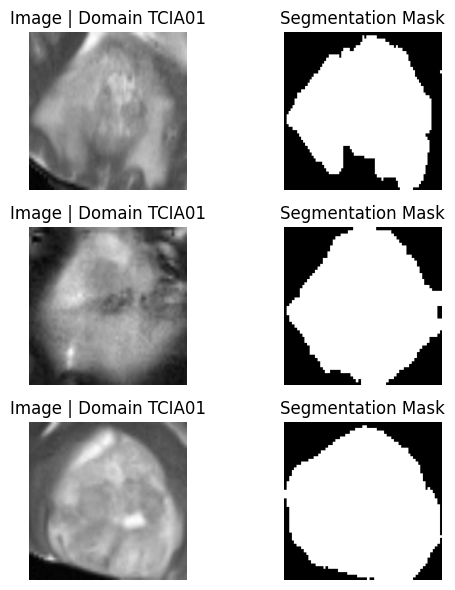

In [ ]:
import matplotlib.pyplot as plt

for i, (images, masks, domain_labels, _) in enumerate(train_loader):
    print(f"Batch {i}:")
    print("Image shape:", images.shape)         # [B, 1, 240, 240]
    print("Mask shape:", masks.shape)           # [B, 1, 240, 240]
    print("Domain labels:", domain_labels)      # [B]
    
    images = images.squeeze(1).cpu().numpy()    # [B, 240, 240]
    masks = masks.squeeze(1).cpu().numpy()      # [B, 240, 240]

    num_show = min(3, images.shape[0])
    fig, axs = plt.subplots(num_show, 2, figsize=(6, 6))

    for idx in range(num_show):
        axs[idx, 0].imshow(images[idx], cmap='gray')
        axs[idx, 0].set_title(f"Image | Domain {domain_labels[i]}")
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(masks[idx], cmap='gray')
        axs[idx, 1].set_title("Segmentation Mask")
        axs[idx, 1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torch
import torch.nn as nn
import torch.nn.functional as F


### --- Gradient Reversal Layer --- ###
class GradientReversalFunction(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_
        return x.view_as(x)

    @staticmethod
    def backward(ctx, grad_output):
        return grad_output.neg() * ctx.lambda_, None


class GradientReversalLayer(nn.Module):
    def __init__(self, lambda_=1.0):
        super().__init__()
        self.lambda_ = lambda_

    def forward(self, x):
        return GradientReversalFunction.apply(x, self.lambda_)


### --- Modular Loss Functions --- ###
def dice_loss(pred, target, smooth=1e-5):
    pred = pred.contiguous()
    target = target.contiguous()
    intersection = (pred * target).sum(dim=(2, 3))
    union = pred.sum(dim=(2, 3)) + target.sum(dim=(2, 3))
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice.mean()
def entropy_loss(pred):
    """
    Computes the pixel-wise entropy loss.
    pred: Tensor of shape [B, C, H, W] after softmax activation
    """
    eps = 1e-8
    entropy = -pred * torch.log(pred + eps)
    return entropy.sum(dim=1).mean()

def bce_loss(pred, target):
    return F.binary_cross_entropy(pred, target)

def Lseg(pred, target, alpha=0.3):
    return alpha*entropy_loss(pred,target) 


### --- Full Model with U-Net + GRL Domain Classifier --- ###
class UNetWithDomain(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, num_domains=3, grl_lambda=1.0):
        super().__init__()

        def CBR(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(inplace=True),
            )

        self.enc1 = CBR(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = CBR(64, 128)
        self.pool2 = nn.MaxPool2d(2)

        self.bridge = CBR(128, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = CBR(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = CBR(128, 64)

        self.final = nn.Conv2d(64, out_channels, kernel_size=1)

        self.grl = GradientReversalLayer(lambda_=grl_lambda)
        self.domain_classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, num_domains)
        )

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        bridge = self.bridge(self.pool2(enc2))

        dec2 = self.dec2(torch.cat([self.up2(bridge), enc2], dim=1))
        dec1 = self.dec1(torch.cat([self.up1(dec2), enc1], dim=1))

        seg_out = torch.sigmoid(self.final(dec1))

        domain_out = self.domain_classifier(self.grl(bridge))

        return seg_out, domain_out



### --- Training Loop --- ###
def train_with_domain(model, dataloader, optimizer, device, seg_loss_fn, domain_loss_fn, dataset_paths, alpha=0.5, num_epochs=20):
    model.to(device)
    model.train()

    for epoch in range(num_epochs):
        total_loss = 0
        total_dom_loss = 0
        skipped_batches = 0

        for batch in dataloader:
            if batch is None or len(batch[0]) == 0:
                skipped_batches += 1
                continue

            imgs, masks, domain_strs, _ = batch
            imgs, masks = imgs.to(device), masks.to(device)

            seg_out, domain_predictions = model(imgs)
            domain_targets = torch.tensor([
                list(dataset_paths.keys()).index(d) for d in domain_strs
            ], device=device)

            seg_loss = seg_loss_fn(seg_out, masks)
            dom_loss = domain_loss_fn(domain_predictions, domain_targets)

            loss = seg_loss + alpha * dom_loss

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += seg_loss.item()
            total_dom_loss += dom_loss.item()

        print(f"Epoch {epoch+1}: Lseg={total_loss:.4f} | Ldom={total_dom_loss:.4f} | Skipped={skipped_batches}")
    return model


In [ ]:
from torch import nn, optim
model = UNetWithDomain(in_channels=1, out_channels=1, num_domains=len(dataset_paths))

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=3e-5)

# Losses
seg_loss_fn = Lseg
domain_loss_fn = nn.CrossEntropyLoss()

In [ ]:
trained=train_with_domain(
    model=model,
    dataloader=train_loader,
    optimizer=optimizer,
    device='cuda',  # or 'cpu' if no GPU
    seg_loss_fn=seg_loss_fn,
    domain_loss_fn=domain_loss_fn,
    dataset_paths=dataset_paths,
    alpha=0.5,       # weight for domain loss
    num_epochs=50
)

In [ ]:
def evaluate_model(model, dataloader, device, dataset_paths):
    model.eval()
    model.to(device)

    dice_scores = []
    iou_scores = []
    correct_domains = 0
    total_domains = 0

    with torch.no_grad():
        for batch in dataloader:
            if batch is None or len(batch[0]) == 0:
                continue

            imgs, masks, domain_strs, _ = batch
            imgs = imgs.to(device)
            masks = masks.to(device)

            seg_out, domain_logits = model(imgs)

            # Binarize segmentation output
            preds = (seg_out > 0.5).float()

            # Dice
            intersection = (preds * masks).sum(dim=(2, 3))
            union = preds.sum(dim=(2, 3)) + masks.sum(dim=(2, 3))
            dice = (2 * intersection + 1e-5) / (union + 1e-5)
            dice_scores.extend(dice.cpu().numpy())

            # IoU
            iou = intersection / ((preds + masks - preds * masks).sum(dim=(2, 3)) + 1e-5)
            iou_scores.extend(iou.cpu().numpy())

            # Domain prediction
            domain_ids = torch.tensor(
                [list(dataset_paths.keys()).index(d) for d in domain_strs],
                device=device
            )
            pred_ids = torch.argmax(domain_logits, dim=1)
            correct_domains += (pred_ids == domain_ids).sum().item()
            total_domains += len(domain_ids)

    avg_dice = sum(dice_scores) / len(dice_scores)
    avg_iou = sum(iou_scores) / len(iou_scores)
    domain_acc = correct_domains / total_domains

    print(f"Evaluation Results:")
    print(f"Dice Score:  {float(avg_dice):.4f}")
    print(f"IoU Score:   {float(avg_iou):.4f}")
    print(f"Domain Acc:  {domain_acc:.4f}")

    return float(avg_dice), float(avg_iou), domain_acc
evaluate_model(model, val_loader, device='cuda', dataset_paths=dataset_paths)